*Author: Dimas*
# Champions Exploration And Prediction Attempt

### In this notebook, we will be exploring data related to champions, which are characters that players can play as during the game. We will also be looking at how we might predict an outcome of a game by using such a categorical data.

In [21]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import ast

pd.set_option('display.max_rows', 20)
pd.set_option('display.max_columns', 20)
pd.set_option('display.width', 10)

In [22]:
gameData = pd.read_csv("datasets/LeagueofLegends.csv")
gameData

,League,Year,Season,Type,blueTeamTag,bResult,rResult,redTeamTag,gamelength,golddiff,...,redMiddleChamp,goldredMiddle,redADC,redADCChamp,goldredADC,redSupport,redSupportChamp,goldredSupport,redBans,Address
0,NALCS,2015,Spring,Season,TSM,1,0,C9,40,"[0, 0, -14, -65, -268, -431, -488, -789, -494,...",...,Fizz,"[475, 475, 552, 842, 1178, 1378, 1635, 1949, 2...",Sneaky,Sivir,"[475, 475, 532, 762, 1097, 1469, 1726, 2112, 2...",LemonNation,Thresh,"[515, 515, 577, 722, 911, 1042, 1194, 1370, 14...","['Tristana', 'Leblanc', 'Nidalee']",http://matchhistory.na.leagueoflegends.com/en/...
1,NALCS,2015,Spring,Season,CST,0,1,DIG,38,"[0, 0, -26, -18, 147, 237, -152, 18, 88, -242,...",...,Azir,"[475, 475, 552, 786, 1097, 1389, 1660, 1955, 2...",CoreJJ,Corki,"[475, 475, 532, 868, 1220, 1445, 1732, 1979, 2...",KiWiKiD,Annie,"[515, 515, 583, 752, 900, 1066, 1236, 1417, 15...","['RekSai', 'Janna', 'Leblanc']",http://matchhistory.na.leagueoflegends.com/en/...
2,NALCS,2015,Spring,Season,WFX,1,0,GV,40,"[0, 0, 10, -60, 34, 37, 589, 1064, 1258, 913, ...",...,Azir,"[475, 475, 533, 801, 1006, 1233, 1385, 1720, 1...",Cop,Corki,"[475, 475, 533, 781, 1085, 1398, 1782, 1957, 2...",BunnyFuFuu,Janna,"[515, 515, 584, 721, 858, 1002, 1168, 1303, 14...","['Leblanc', 'Zed', 'RekSai']",http://matchhistory.na.leagueoflegends.com/en/...
3,NALCS,2015,Spring,Season,TIP,0,1,TL,41,"[0, 0, -15, 25, 228, -6, -243, 175, -346, 16, ...",...,Lulu,"[475, 475, 532, 771, 1046, 1288, 1534, 1776, 2...",KEITH,KogMaw,"[475, 475, 532, 766, 1161, 1438, 1776, 1936, 2...",Xpecial,Janna,"[515, 515, 583, 721, 870, 1059, 1205, 1342, 15...","['RekSai', 'Rumble', 'LeeSin']",http://matchhistory.na.leagueoflegends.com/en/...
4,NALCS,2015,Spring,Season,CLG,1,0,T8,35,"[40, 40, 44, -36, 113, 158, -121, -191, 23, 20...",...,Lulu,"[475, 475, 532, 807, 1042, 1338, 1646, 1951, 2...",Maplestreet8,Corki,"[475, 475, 532, 792, 1187, 1488, 1832, 2136, 2...",Dodo8,Annie,"[475, 475, 538, 671, 817, 948, 1104, 1240, 136...","['Rumble', 'Sivir', 'Rengar']",http://matchhistory.na.leagueoflegends.com/en/...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7615,TCL,2018,Spring,Season,YC,0,1,SUP,34,"[0, 0, -18, -95, 45, -87, -117, 199, 126, 92, ...",...,Veigar,"[500, 500, 632, 982, 1258, 1667, 2060, 2390, 2...",Zeitnot,Xayah,"[500, 500, 564, 1027, 1320, 1727, 1963, 2276, ...",SnowFlower,Rakan,"[500, 500, 566, 801, 1004, 1234, 1463, 1674, 1...","['Ornn', 'Kalista', 'Ryze', 'Alistar', 'Shen']",https://matchhistory.euw.leagueoflegends.com/e...
7616,TCL,2018,Spring,Season,GAL,0,1,DP,39,"[0, 0, -86, -39, -207, -349, -60, -140, 187, -...",...,Ryze,"[500, 500, 612, 1000, 1193, 1626, 1979, 2318, ...",Ruvelius,Caitlyn,"[500, 500, 621, 977, 1420, 1809, 2047, 2413, 2...",Japone,Braum,"[500, 500, 587, 790, 1107, 1335, 1472, 1616, 1...","['Zoe', 'KogMaw', 'JarvanIV', 'Ornn', 'Rengar']",https://matchhistory.euw.leagueoflegends.com/e...
7617,OPL,2018,Spring,Season,SIN,0,1,DW,24,"[0, -8, -6, 116, 103, -92, -470, -958, -1998, ...",...,Malzahar,"[500, 500, 615, 903, 1225, 1617, 1976, 2304, 2...",k1ng,Ezreal,"[500, 508, 592, 986, 1400, 1753, 2196, 2538, 3...",Cupcake,Taric,"[500, 500, 585, 770, 976, 1222, 1446, 1627, 19...","['Azir', 'Kalista', 'Braum', 'Maokai', 'Alistar']",https://matchhistory.na.leagueoflegends.com/en...
7618,OPL,2018,Spring,Season,LGC,1,0,TTC,35,"[0, 0, -97, 33, 351, 284, 299, 263, 403, 623, ...",...,Veigar,"[500, 500, 561, 931, 1223, 1631, 1987, 2315, 2...",Low,Sivir,"[500, 500, 634, 930, 1304, 1691, 2042, 2384, 2...",Tilting,Janna,"[500, 500, 592, 788, 1006, 1251, 1490, 1704, 1...","['Kalista', 'Galio', 'Gnar', 'Jayce', 'Sejuani']",https://matchhistory.na.leagueoflegends.com/en...


### Now, we will create a new dataframe which shows the champions chosen for each position, for every game.

In [23]:
relevantData = gameData.filter(['bResult', 'blueTopChamp', 'blueJungleChamp', 'blueMiddleChamp', 'blueADCChamp', 'blueSupportChamp', 'redTopChamp', 'redJungleChamp', 'redMiddleChamp', 'redADCChamp', 'redSupportChamp',], axis=1)
#all the 1's on bResult are blue team winning, 0 is red team win.

betterData = {
    "win": [],
    "topChamp": [],
    "jungleChamp": [],
    "middleChamp": [],
    "ADCChamp": [],
    "supportChamp": [],
}

for index in range(7620):
    if relevantData["bResult"][index] == 1:
        #blue wins
        betterData["win"].append(True)
        betterData["topChamp"].append(relevantData["blueTopChamp"][index])
        betterData["jungleChamp"].append(relevantData["blueJungleChamp"][index])
        betterData["middleChamp"].append(relevantData["blueMiddleChamp"][index])
        betterData["ADCChamp"].append(relevantData["blueADCChamp"][index])
        betterData["supportChamp"].append(relevantData["blueSupportChamp"][index])
        betterData["win"].append(False)
        betterData["topChamp"].append(relevantData["redTopChamp"][index])
        betterData["jungleChamp"].append(relevantData["redJungleChamp"][index])
        betterData["middleChamp"].append(relevantData["redMiddleChamp"][index])
        betterData["ADCChamp"].append(relevantData["redADCChamp"][index])
        betterData["supportChamp"].append(relevantData["redSupportChamp"][index])
    else:
        #red wins.
        betterData["win"].append(True)
        betterData["topChamp"].append(relevantData["redTopChamp"][index])
        betterData["jungleChamp"].append(relevantData["redJungleChamp"][index])
        betterData["middleChamp"].append(relevantData["redMiddleChamp"][index])
        betterData["ADCChamp"].append(relevantData["redADCChamp"][index])
        betterData["supportChamp"].append(relevantData["redSupportChamp"][index])
        betterData["win"].append(False)
        betterData["topChamp"].append(relevantData["blueTopChamp"][index])
        betterData["jungleChamp"].append(relevantData["blueJungleChamp"][index])
        betterData["middleChamp"].append(relevantData["blueMiddleChamp"][index])
        betterData["ADCChamp"].append(relevantData["blueADCChamp"][index])
        betterData["supportChamp"].append(relevantData["blueSupportChamp"][index])

champData = pd.DataFrame(betterData)
champData

,win,topChamp,jungleChamp,middleChamp,ADCChamp,supportChamp
0,True,Irelia,RekSai,Ahri,Jinx,Janna
1,False,Gnar,Elise,Fizz,Sivir,Thresh
2,True,Irelia,JarvanIV,Azir,Corki,Annie
3,False,Gnar,Rengar,Ahri,Caitlyn,Leona
4,True,Renekton,Rengar,Fizz,Sivir,Annie
...,...,...,...,...,...,...
15235,False,Camille,JarvanIV,Cassiopeia,Varus,Janna
15236,True,Ornn,Khazix,Azir,Ezreal,Braum
15237,False,Gangplank,JarvanIV,Veigar,Sivir,Janna
15238,True,Ornn,JarvanIV,Malzahar,Vayne,Braum


### Before we take into account their positions, let's look at the data of all the champions in total.

In [24]:
totalChamps = {
    "win": [],
    "champions": [],
}

for index in range(15240):
    row = champData.iloc[index]
    for x in range(1, 6):
        totalChamps["win"].append(row[0])
        totalChamps["champions"].append(row[x])

totalChamps = pd.DataFrame(totalChamps)
totalChamps

,win,champions
0,True,Irelia
1,True,RekSai
2,True,Ahri
3,True,Jinx
4,True,Janna
...,...,...
76195,False,Gangplank
76196,False,Zac
76197,False,Cassiopeia
76198,False,Ezreal


## Let's list out which champions were the most popularly chosen.

Gragas          2555
RekSai          2330
Braum           2115
Elise           2065
Thresh          1923
                ... 
MonkeyKing         4
Volibear           4
Garen              2
FiddleSticks       2
Tryndamere         1
Name: champions, Length: 140, dtype: int64


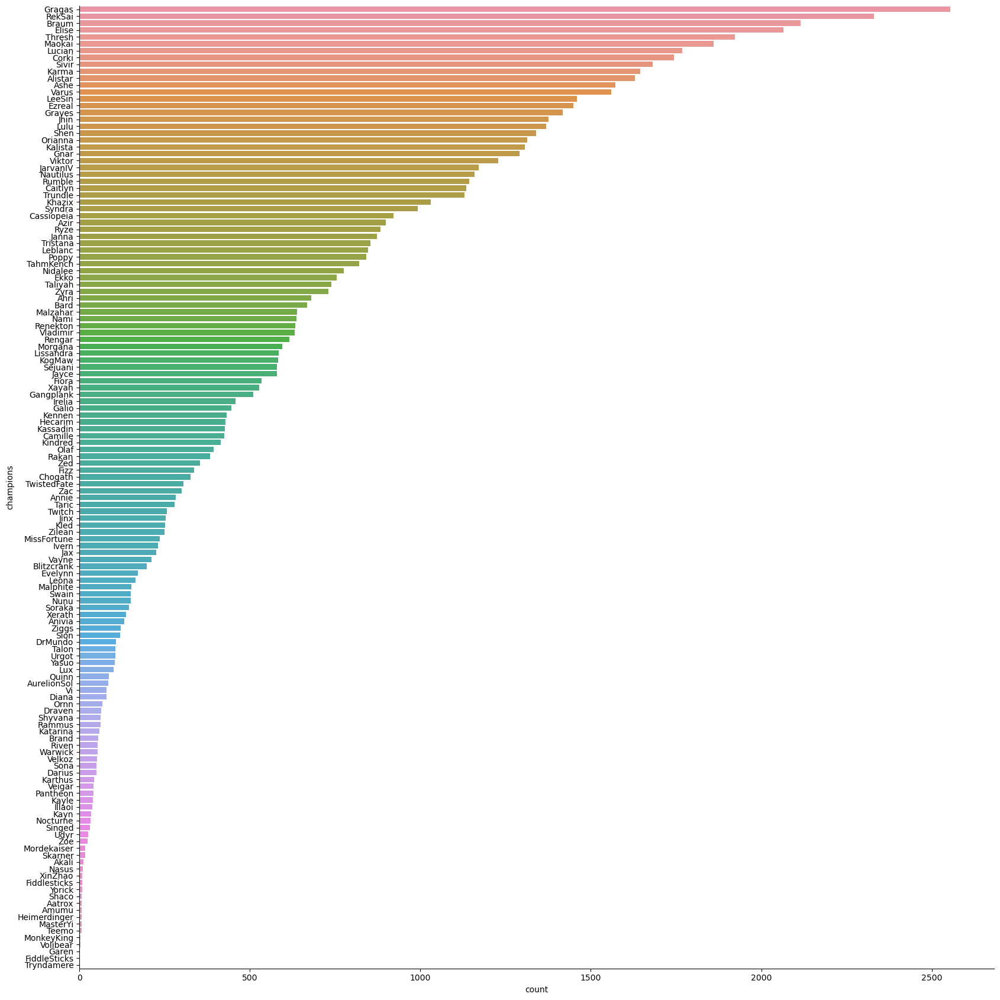

In [25]:
sb.catplot(y = "champions", data = totalChamps, kind = "count", height = 17, order = totalChamps['champions'].value_counts().index)
print(totalChamps['champions'].value_counts())

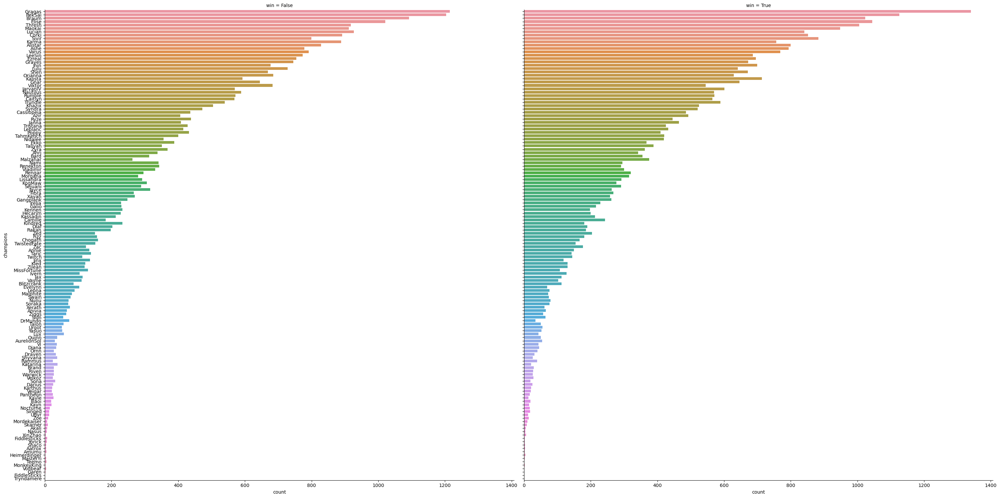

In [26]:
sb.catplot(y = 'champions', data = totalChamps, col = 'win', kind = 'count', col_wrap = 2, height = 15, order = totalChamps['champions'].value_counts().index)

## Now, let's seperate them based on their positions.

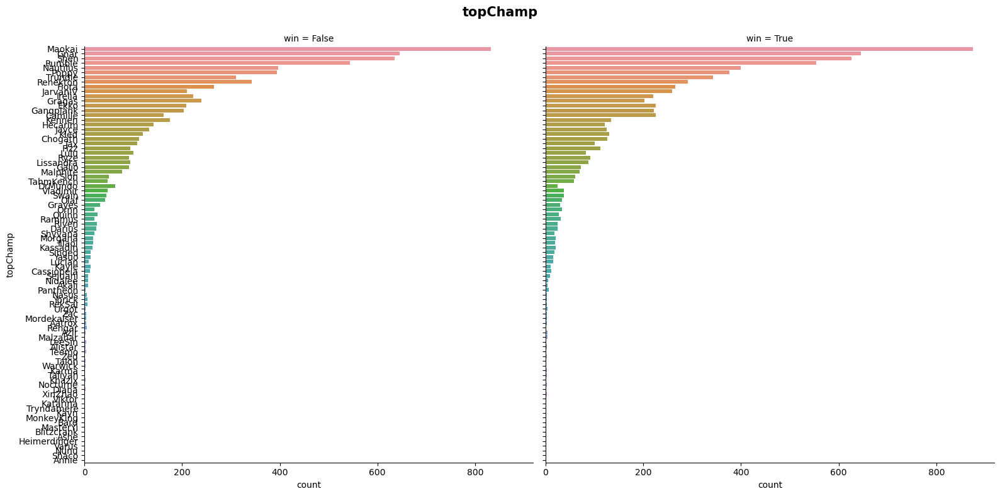

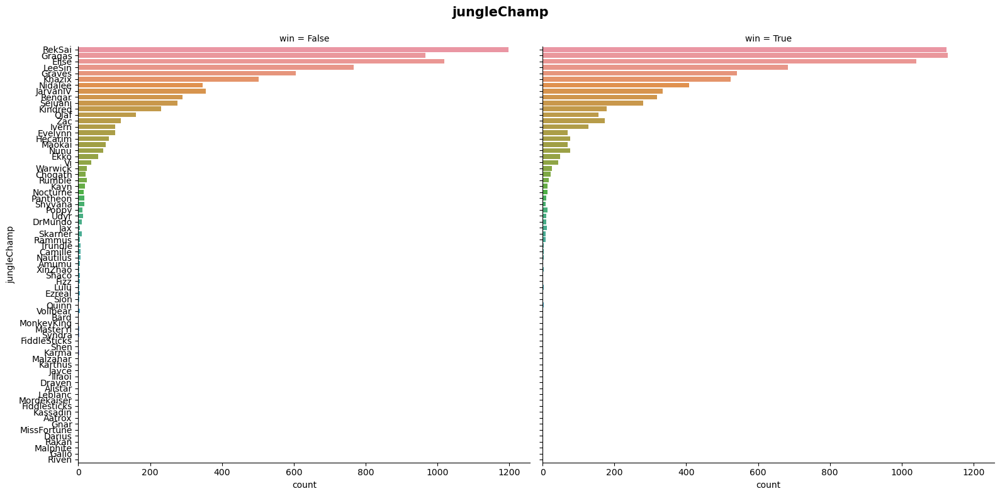

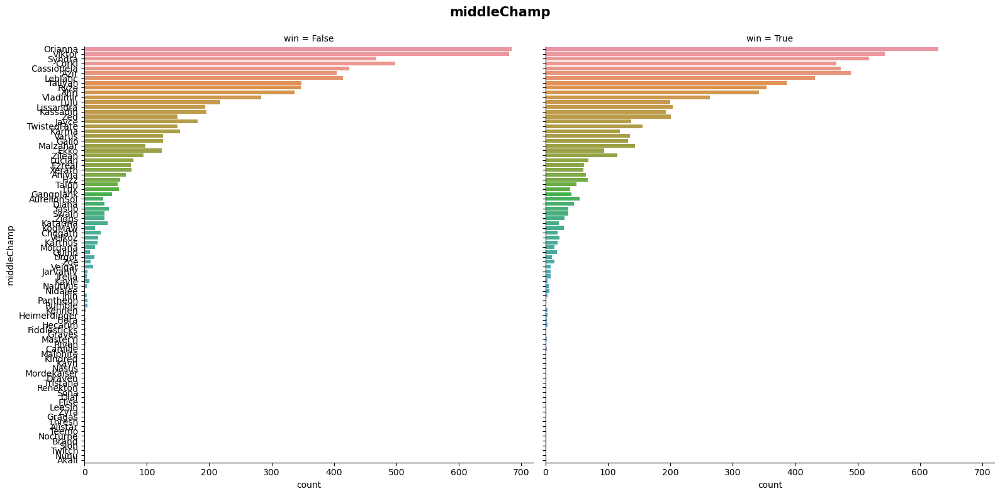

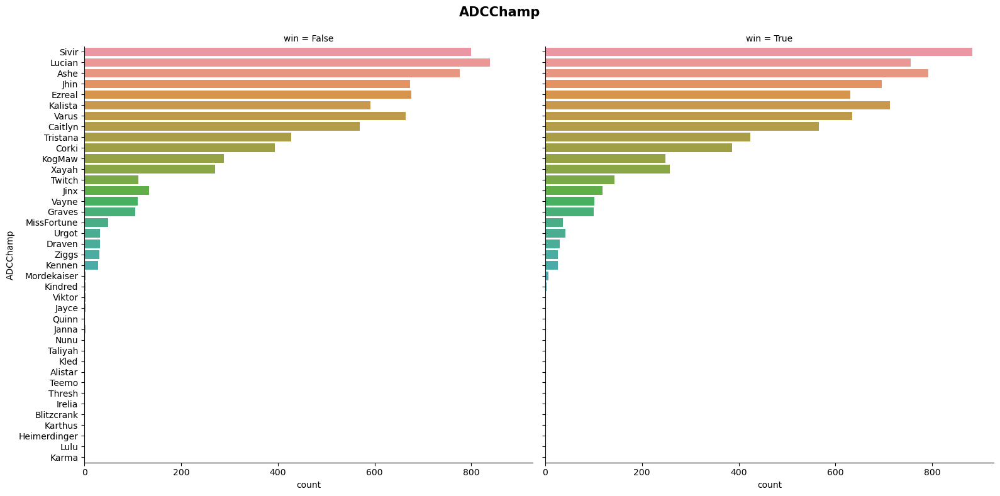

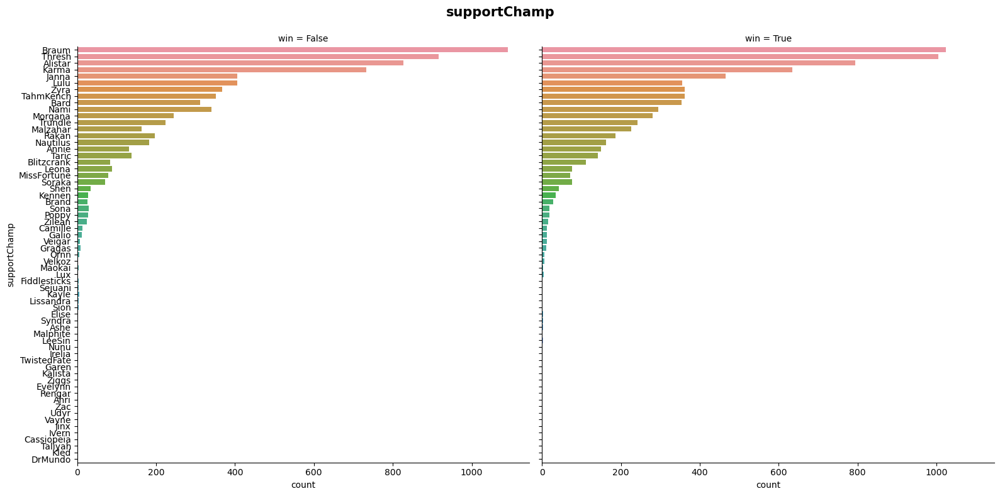

In [27]:
for column in champData:
    if column != 'win':
        sb.catplot(y = column, data = champData, col = 'win', kind = 'count', col_wrap = 2, height = 8, order = champData[column].value_counts().index)
        plt.suptitle(column, fontsize=15, fontweight='bold')
        plt.subplots_adjust(top=0.9)

### Let's list the top 10 most chosen for each position, in numerical format.

In [28]:
def listTop10(position):
    print(f"Top chosen champions for {position}:")
    print(champData[position].value_counts().head(10))
    print()

for column in champData:
    if column != 'win':
        listTop10(column)

Top chosen champions for topChamp:
Maokai      1707
Gnar        1290
Shen        1261
Rumble      1097
Nautilus     796
Poppy        770
Trundle      653
Renekton     633
Fiora        531
JarvanIV     469
Name: topChamp, dtype: int64

Top chosen champions for jungleChamp:
RekSai      2322
Gragas      2094
Elise       2060
LeeSin      1450
Graves      1148
Khazix      1027
Nidalee      755
JarvanIV     689
Rengar       609
Sejuani      558
Name: jungleChamp, dtype: int64

Top chosen champions for middleChamp:
Orianna       1314
Viktor        1225
Syndra         987
Corki          964
Cassiopeia     898
Azir           893
Leblanc        846
Taliyah        734
Ryze           701
Ahri           679
Name: middleChamp, dtype: int64

Top chosen champions for ADCChamp:
Sivir       1682
Lucian      1595
Ashe        1568
Jhin        1369
Ezreal      1307
Kalista     1304
Varus       1298
Caitlyn     1134
Tristana     852
Corki        780
Name: ADCChamp, dtype: int64

Top chosen champions for sup

## We've seen their popularities... but how many times did they win?

In [29]:
def listMostWins(position, topNo):
    wins = {}
    for champ in champData[position].unique():
        wins[champ] = 0
    index = 0
    for value in champData[position]:
        if(champData['win'][index] == True):
            wins[value] += 1
        index += 1
    wins_sorted = dict(sorted(wins.items(), key=lambda item: item[1]))
    print(f"Number of wins for each champion in {position}")
    index = 0
    for entry in reversed(wins_sorted):
        print(f"{entry}: {wins_sorted[entry]}")
        index += 1
        if index == topNo:
            break
    print()

listMostWins('topChamp', 10)
listMostWins('jungleChamp', 10)
listMostWins('middleChamp', 10)
listMostWins('ADCChamp', 10)
listMostWins('supportChamp', 10)

Number of wins for each champion in topChamp
Maokai: 875
Gnar: 645
Shen: 626
Rumble: 554
Nautilus: 399
Poppy: 376
Trundle: 343
Renekton: 291
Fiora: 266
JarvanIV: 259

Number of wins for each champion in jungleChamp
Gragas: 1128
RekSai: 1124
Elise: 1041
LeeSin: 683
Graves: 542
Khazix: 524
Nidalee: 408
JarvanIV: 334
Rengar: 318
Sejuani: 281

Number of wins for each champion in middleChamp
Orianna: 629
Viktor: 544
Syndra: 519
Azir: 489
Cassiopeia: 473
Corki: 466
Leblanc: 432
Taliyah: 386
Ryze: 354
Ahri: 342

Number of wins for each champion in ADCChamp
Sivir: 883
Ashe: 792
Lucian: 756
Kalista: 712
Jhin: 696
Varus: 634
Ezreal: 631
Caitlyn: 565
Tristana: 424
Corki: 386

Number of wins for each champion in supportChamp
Braum: 1023
Thresh: 1005
Alistar: 794
Karma: 635
Janna: 465
TahmKench: 362
Zyra: 362
Lulu: 356
Bard: 353
Nami: 295



## Let's find out their rate of winning by calculating wins/uses.

In [30]:
def listWinRate(position, topNo):
    wins = {}
    total = {}
    for champ in champData[position].unique():
        wins[champ] = 0
        total[champ] = 0
    index = 0
    for value in champData[position]:
        total[value] += 1
        if(champData['win'][index] == True):
            wins[value] += 1
        index += 1
        
    wins_sorted = dict(sorted(wins.items(), key=lambda item: item[1]))
    print(f"Number of wins of each champion in {position}:")
    index = 0
    for entry in reversed(wins_sorted):
        print(f"{entry}: {wins[entry]}")
        print(f"win rate: {wins[entry]/total[entry]*100}")
        index += 1
        if index == topNo:
            break
    print()

listWinRate('topChamp', 10)
listWinRate('jungleChamp', 10)
listWinRate('middleChamp', 10)
listWinRate('ADCChamp', 10)
listWinRate('supportChamp', 10)

Number of wins of each champion in topChamp:
Maokai: 875
win rate: 51.259519625073224
Gnar: 645
win rate: 50.0
Shen: 626
win rate: 49.64314036478985
Rumble: 554
win rate: 50.50136736554239
Nautilus: 399
win rate: 50.12562814070351
Poppy: 376
win rate: 48.83116883116883
Trundle: 343
win rate: 52.526799387442566
Renekton: 291
win rate: 45.97156398104265
Fiora: 266
win rate: 50.09416195856874
JarvanIV: 259
win rate: 55.223880597014926

Number of wins of each champion in jungleChamp:
Gragas: 1128
win rate: 53.86819484240688
RekSai: 1124
win rate: 48.40654608096469
Elise: 1041
win rate: 50.53398058252427
LeeSin: 683
win rate: 47.10344827586207
Graves: 542
win rate: 47.21254355400697
Khazix: 524
win rate: 51.02239532619279
Nidalee: 408
win rate: 54.03973509933775
JarvanIV: 334
win rate: 48.47605224963715
Rengar: 318
win rate: 52.21674876847291
Sejuani: 281
win rate: 50.358422939068106

Number of wins of each champion in middleChamp:
Orianna: 629
win rate: 47.86910197869102
Viktor: 544
win ra

Now lets try to visualise the win rate

In [31]:
# create a df to visualise the winrate
winrate = totalChamps['champions'].value_counts()
winratedf = pd.DataFrame(winrate)
winratedf = winratedf.reset_index()
winratedf.rename(columns={'index':'champions', 'champions':'totalgames'}, inplace=True)

new_df = (
    pd.get_dummies(totalChamps, columns=['win'])
        .groupby('champions', as_index=False)
        .sum()
)

winratedf = pd.DataFrame.merge(winratedf, new_df, on='champions')
winratedf['winrate'] = winratedf['win_True']/winratedf['totalgames']
winratedf = winratedf[winratedf['totalgames'] >= 50] # drop the champions with too less games
winratedf

,champions,totalgames,win_False,win_True,winrate
0,Gragas,2555,1215,1340,0.524462
1,RekSai,2330,1204,1126,0.483262
2,Braum,2115,1092,1023,0.483688
3,Elise,2065,1021,1044,0.505569
4,Thresh,1923,918,1005,0.522621
...,...,...,...,...,...
107,Riven,54,27,27,0.500000
108,Warwick,53,27,26,0.490566
109,Velkoz,52,24,28,0.538462
110,Sona,50,31,19,0.380000


In [32]:
# do the same for each role
support = champData['supportChamp'].value_counts().rename_axis('champions').reset_index(name='totalgames')
top = champData['topChamp'].value_counts().rename_axis('champions').reset_index(name='totalgames')
jungle = champData['jungleChamp'].value_counts().rename_axis('champions').reset_index(name='totalgames')
middle = champData['middleChamp'].value_counts().rename_axis('champions').reset_index(name='totalgames')
ADC = champData['ADCChamp'].value_counts().rename_axis('champions').reset_index(name='totalgames')

new_df = pd.get_dummies(champData, columns=['win']).groupby('supportChamp', as_index=False).sum(numeric_only=True).rename(columns={'supportChamp':'champions'})
support = pd.DataFrame.merge(support, new_df, on='champions')
support['winrate'] = support['win_True']/support['totalgames']
support = support[support['totalgames'] >= 50]

new_df = pd.get_dummies(champData, columns=['win']).groupby('topChamp', as_index=False).sum(numeric_only=True).rename(columns={'topChamp':'champions'})
top = pd.DataFrame.merge(top, new_df, on='champions')
top['winrate'] = top['win_True']/top['totalgames']
top = top[top['totalgames'] >= 50]

new_df = pd.get_dummies(champData, columns=['win']).groupby('middleChamp', as_index=False).sum(numeric_only=True).rename(columns={'middleChamp':'champions'})
middle = pd.DataFrame.merge(middle, new_df, on='champions')
middle['winrate'] = middle['win_True']/middle['totalgames']
middle = middle[middle['totalgames'] >= 50]

new_df = pd.get_dummies(champData, columns=['win']).groupby('jungleChamp', as_index=False).sum(numeric_only=True).rename(columns={'jungleChamp':'champions'})
jungle = pd.DataFrame.merge(jungle, new_df, on='champions')
jungle['winrate'] = jungle['win_True']/jungle['totalgames']
jungle = jungle[jungle['totalgames'] >= 50]

new_df = pd.get_dummies(champData, columns=['win']).groupby('ADCChamp', as_index=False).sum(numeric_only=True).rename(columns={'ADCChamp':'champions'})
ADC = pd.DataFrame.merge(ADC, new_df, on='champions')
ADC['winrate'] = ADC['win_True']/ADC['totalgames']
ADC = ADC[ADC['totalgames'] >= 50]

jungle

,champions,totalgames,win_False,win_True,winrate
0,RekSai,2322,1198,1124,0.484065
1,Gragas,2094,966,1128,0.538682
2,Elise,2060,1019,1041,0.505340
3,LeeSin,1450,767,683,0.471034
4,Graves,1148,606,542,0.472125
...,...,...,...,...,...
16,Maokai,146,76,70,0.479452
17,Nunu,145,69,76,0.524138
18,Ekko,103,55,48,0.466019
19,Vi,79,36,43,0.544304


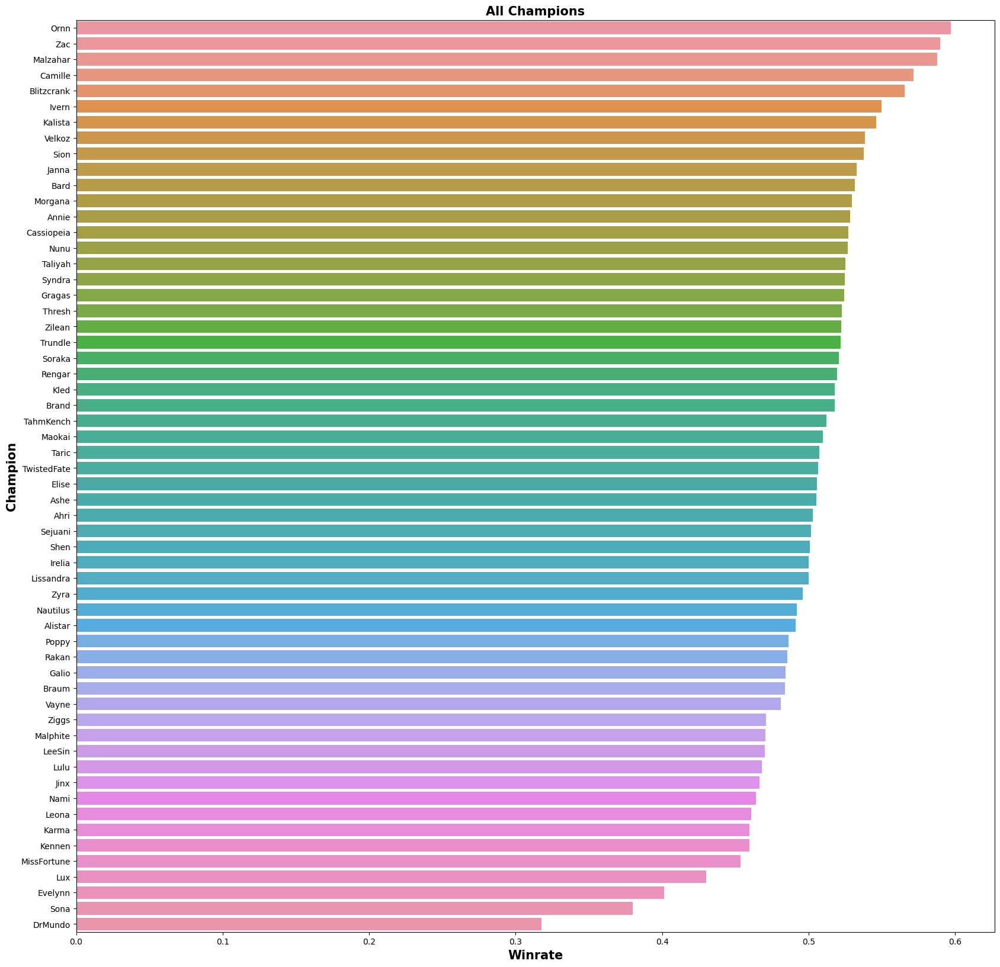

In [33]:
f = plt.figure(figsize=(20,20))
sb.barplot(data=winratedf[winratedf['champions'].isin(champData['supportChamp'])].sort_values(['winrate'], ascending=False), y='champions', x='winrate')
plt.xlabel('Winrate', fontsize=15, fontweight='bold')
plt.ylabel('Champion', fontsize=15, fontweight='bold')
plt.title('All Champions', fontsize = 15, fontweight = 'bold')
plt.show()

C:\Users\User\AppData\Local\Temp\ipykernel_8348\4283355308.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  p1 = plt.subplot2grid((1,5), (0,0), colspan=1, rowspan=1)
C:\Users\User\AppData\Local\Temp\ipykernel_8348\4283355308.py:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  p2 = plt.subplot2grid((1,5), (0,1), colspan=1, rowspan=1)
C:\Users\User\AppData\Local\Temp\ipykernel_8348\4283355308.py:15: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  p3 = plt.subplot2grid((1,5), (0,2), colspan=1, rowspan=1)
C:\Users\User\AppData\Local\Temp\ipykernel_8348\4283355308.py:21: MatplotlibDeprecationWarning: Auto-removal

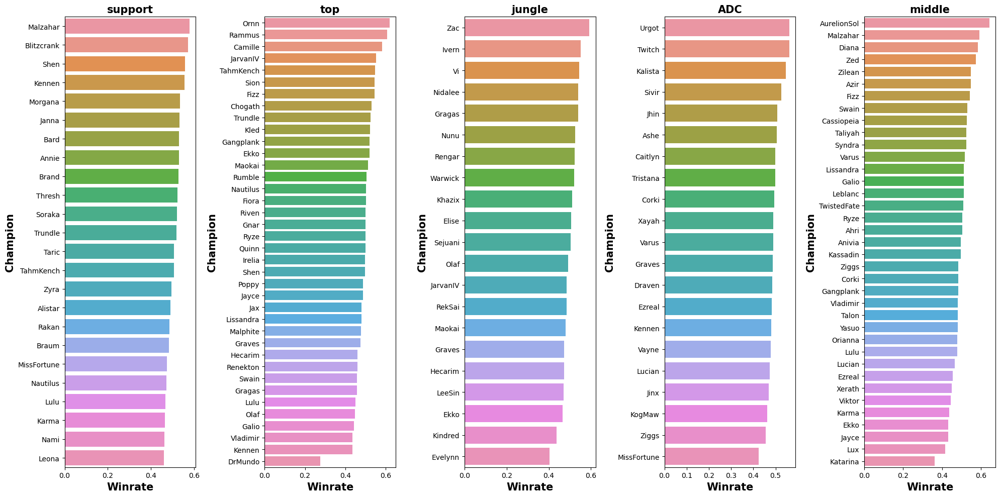

In [34]:
f, axes = plt.subplots(1, 5, figsize=(20,10))

p1 = plt.subplot2grid((1,5), (0,0), colspan=1, rowspan=1)
sb.barplot(data=support.sort_values(['winrate'], ascending=False), y='champions', x='winrate')
plt.xlabel('Winrate', fontsize=15, fontweight='bold')
plt.ylabel('Champion', fontsize=15, fontweight='bold')
plt.title('support', fontsize = 15, fontweight = 'bold')

p2 = plt.subplot2grid((1,5), (0,1), colspan=1, rowspan=1)
sb.barplot(data=top.sort_values(['winrate'], ascending=False), y='champions', x='winrate')
plt.xlabel('Winrate', fontsize=15, fontweight='bold')
plt.ylabel('Champion', fontsize=15, fontweight='bold')
plt.title('top', fontsize = 15, fontweight = 'bold')

p3 = plt.subplot2grid((1,5), (0,2), colspan=1, rowspan=1)
sb.barplot(data=jungle.sort_values(['winrate'], ascending=False), y='champions', x='winrate')
plt.xlabel('Winrate', fontsize=15, fontweight='bold')
plt.ylabel('Champion', fontsize=15, fontweight='bold')
plt.title('jungle', fontsize = 15, fontweight = 'bold')

p4 = plt.subplot2grid((1,5), (0,3), colspan=1, rowspan=1)
sb.barplot(data=ADC.sort_values(['winrate'], ascending=False), y='champions', x='winrate')
plt.xlabel('Winrate', fontsize=15, fontweight='bold')
plt.ylabel('Champion', fontsize=15, fontweight='bold')
plt.title('ADC', fontsize = 15, fontweight = 'bold')

p5 = plt.subplot2grid((1,5), (0,4), colspan=1, rowspan=1)
sb.barplot(data=middle.sort_values(['winrate'], ascending=False), y='champions', x='winrate')
plt.xlabel('Winrate', fontsize=15, fontweight='bold')
plt.ylabel('Champion', fontsize=15, fontweight='bold')
plt.title('middle', fontsize = 15, fontweight = 'bold')

plt.tight_layout()
plt.show()

Now we can actually see the champion with the highest win rates for each role from 2014 to 2018. Although there are many factors to winning a game. Perhaps a consideration for future games can be to prioritise to pick champions with higher win rates and avoid picking those champions with lower win rates since these champions are the ones that top players are picking in tournament level matches. 

# Bans

### For each match, there will be a few randomly selected champions that are not allowed for use, to discourage the over-dependence on a single champion.

In [35]:
bansData = gameData.filter(['bResult','blueBans', 'redBans'], axis=1)

for col in bansData:
    if col != 'bResult':
        bansData[col] = bansData[col].apply(ast.literal_eval) #changing all the string values to lists.
    if col == 'bResult':
        for x in range(7620):
            if bansData[col][x] == 1:
                bansData[col][x] = True
            else:
                bansData[col][x] = False

bansData.rename(columns={'bResult': 'Blue Wins'}, inplace=True, errors='raise')

C:\Users\User\AppData\Local\Temp\ipykernel_8348\1072181449.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bansData[col][x] = True


### If we gather all of the data, regardless of team...

In [36]:
betterBans = {
    'win' : [],
    'championsBanned' : [],
    'numberOfChampsBanned' : [],
}

for index in range(7620):
    row = bansData.iloc[index]
    betterBans['win'].append(row[0])
    betterBans['championsBanned'].append(row[1])
    betterBans['numberOfChampsBanned'].append(len(row[1]))
    betterBans['win'].append(not row[0])
    betterBans['championsBanned'].append(row[2])
    betterBans['numberOfChampsBanned'].append(len(row[2]))

betterBans = pd.DataFrame(betterBans)
betterBans

,win,championsBanned,numberOfChampsBanned
0,True,"[Rumble, Kassadin, Lissandra]",3
1,False,"[Tristana, Leblanc, Nidalee]",3
2,False,"[Kassadin, Sivir, Lissandra]",3
3,True,"[RekSai, Janna, Leblanc]",3
4,True,"[JarvanIV, Lissandra, Kassadin]",3
...,...,...,...
15235,True,"[Azir, Kalista, Braum, Maokai, Alistar]",5
15236,True,"[KogMaw, Illaoi, Urgot, Xerath, Karma]",5
15237,False,"[Kalista, Galio, Gnar, Jayce, Sejuani]",5
15238,False,"[Kalista, Gnar, Ryze, Orianna, Sivir]",5


In [37]:
champBanData = {
    'win':[],
    'champBanned':[],
}

index = -1
for entry in betterBans['championsBanned']:
    index += 1
    for champ in entry:
        champBanData["champBanned"].append(champ)
        champBanData["win"].append(betterBans['win'][index])


champBanData = pd.DataFrame(champBanData)
champBanData

,win,champBanned
0,True,Rumble
1,True,Kassadin
2,True,Lissandra
3,False,Tristana
4,False,Leblanc
...,...,...
59311,True,KogMaw
59312,True,Illaoi
59313,True,Azir
59314,True,Karma


Leblanc         2477
Kalista         1959
Ryze            1896
Elise           1577
Shen            1571
                ... 
Fiddlesticks       2
Garen              2
FiddleSticks       2
Amumu              1
Volibear           1
Name: champBanned, Length: 137, dtype: int64


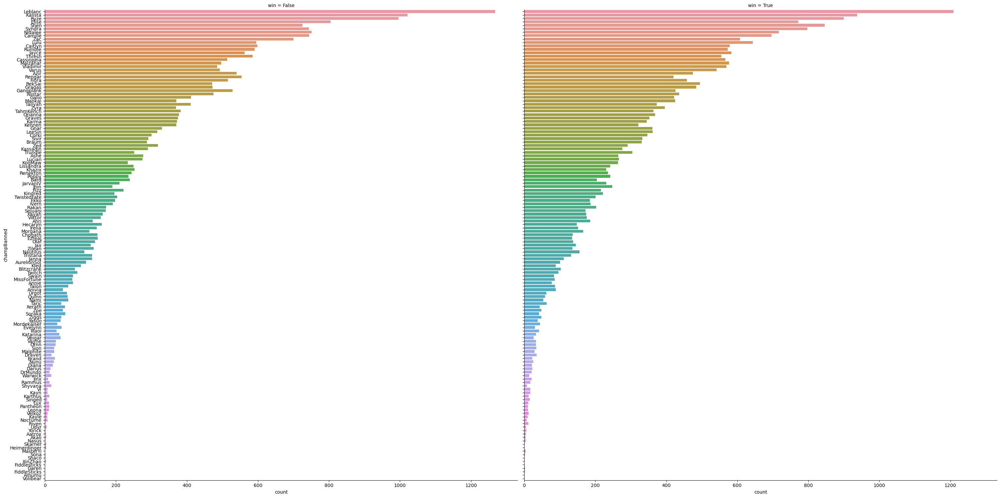

In [38]:
sb.catplot(y = 'champBanned', data = champBanData, col = 'win', kind = 'count', col_wrap = 2, height = 15, order = champBanData['champBanned'].value_counts().index)
print(champBanData['champBanned'].value_counts())

### We also see that the shapes for both wins and losses for this graph is identical, meaning that the bans did not affect the chances of winning, just like earlier. This proves that the teams are well adapted to playing as multiple champions.

In [39]:
champWinData = {
    'champBanned':[],
}

champLossData = {
    'champBanned':[],
}

index = -1
for entry in champBanData['champBanned']:
    index += 1
    if(champBanData['win'][index]):
        champWinData["champBanned"].append(entry)
    else:
        champLossData["champBanned"].append(entry)

champWinData = pd.DataFrame(champWinData)
champLossData = pd.DataFrame(champLossData)

top50BannedWinRate = champBanData['champBanned'].value_counts()

for index in range(50):
    top50BannedWinRate[index] = champWinData['champBanned'].value_counts()[index] / (champWinData['champBanned'].value_counts()[index] + champLossData['champBanned'].value_counts()[index])

top50BannedWinRate = top50BannedWinRate.drop(top50BannedWinRate.index[range(50, 137)])
top50BannedWinRate = top50BannedWinRate.sort_values(ascending=False)
top50BannedWinRate

Sivir        0.524564
Braum        0.524510
LeeSin       0.520362
Shen         0.514858
Corki        0.513097
               ...   
Kalista      0.478816
Gragas       0.478595
Ryze         0.474684
Gangplank    0.474388
Alistar      0.474330
Name: champBanned, Length: 50, dtype: float64

In the top 50 most banned champions, Sivir has the highest winrate 52.4% while aslistar has the lowest 47.4%

# Prediction

### While it has been proven that the characters were relatively balanced, which makes the prediction of outcomes pretty far-fetched, let's try it anyway.

### Predicting a win/loss from a bunch of categorical variables requires one hot encoding, for each champion, we have to store a boolean value (1 or 0) that indicated whether it is being used or not. This is because predictors often use numerical data, instead of categorical.

In [40]:
topDummies = pd.get_dummies(champData['topChamp'])
jungleDummies = pd.get_dummies(champData['jungleChamp'])
middleDummies = pd.get_dummies(champData['middleChamp'])
ADCDummies = pd.get_dummies(champData['ADCChamp'])
supportDummies = pd.get_dummies(champData['supportChamp'])
results = champData['win']

In [41]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import plot_tree

In [42]:
topDummies

,Aatrox,Akali,Alistar,Annie,Ashe,Azir,Bard,Blitzcrank,Camille,Cassiopeia,...,Urgot,Varus,Viktor,Vladimir,Warwick,XinZhao,Yasuo,Yorick,Zac,Zed
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15235,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
15236,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15237,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15238,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [43]:
def getTree(dummyData, depth):
    tree = DecisionTreeClassifier(max_depth=depth)
    dummy_train, dummy_test, result_train, result_test = train_test_split(dummyData, results, test_size = 0.20)
    tree.fit(dummy_train, result_train)
    trainTestData = dummy_train, dummy_test, result_train, result_test
    return tree, trainTestData

def printTree(tree, data, sizeTuple=(75,75)):
    f = plt.figure(figsize=sizeTuple)
    plot_tree(tree,
        feature_names=data[0].columns,
        filled=True, rounded=True, 
        class_names=["Loss","Win"])

## Classification tree regression model is used.

### Seeing that the only numerical values used are 1's and 0's, a classification tree with a small dedpth, such as 5, will probably not be accurate. Hence, let's make the depth as much as 40!

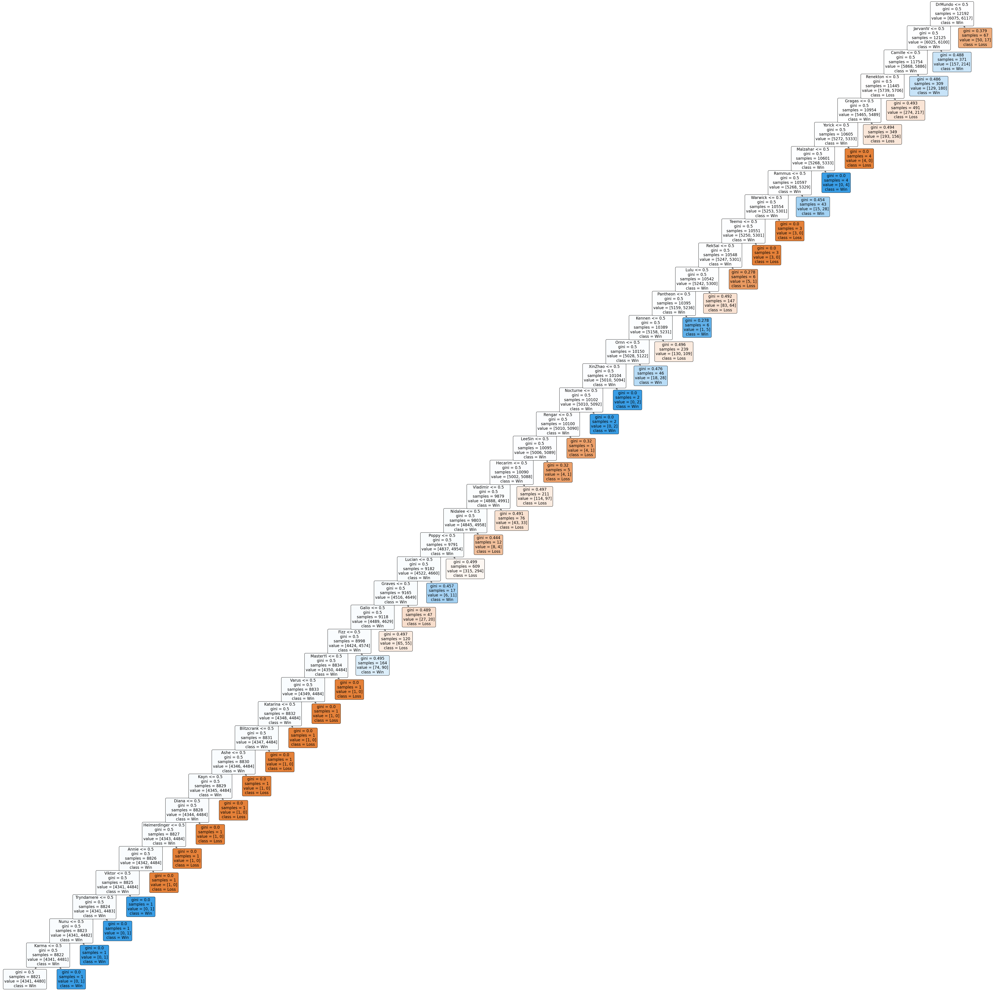

In [44]:
topTree, topData = getTree(topDummies, 40)
printTree(topTree, topData)

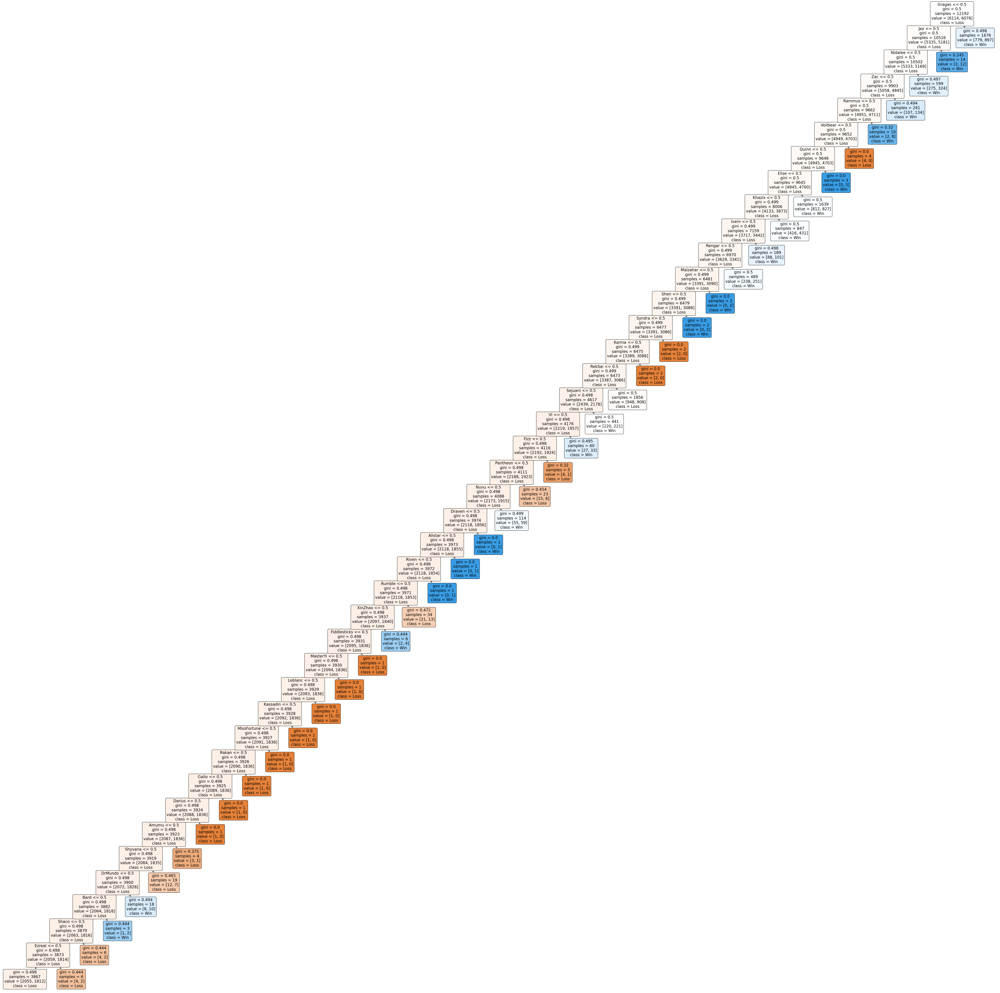

In [45]:
jungleTree, jungleData = getTree(jungleDummies, 40)
printTree(jungleTree, jungleData)

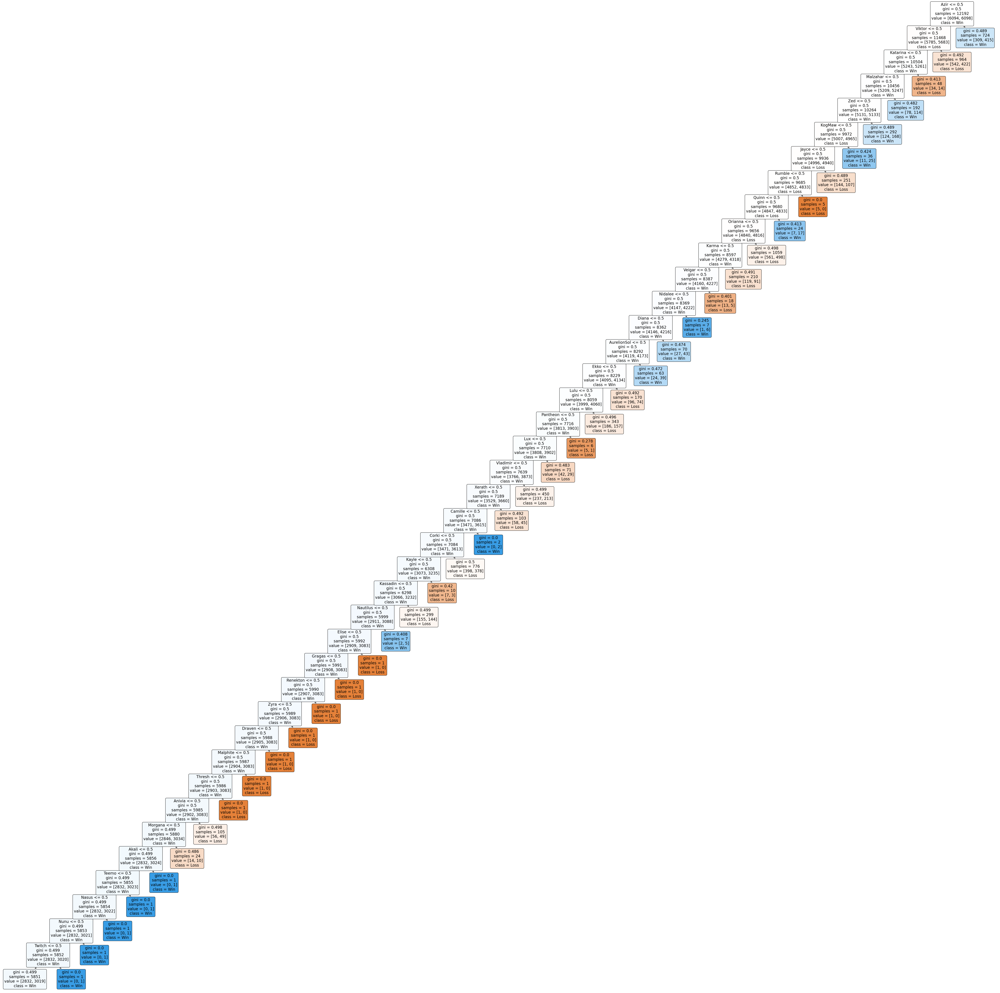

In [46]:
middleTree, middleData = getTree(middleDummies, 40)
printTree(middleTree, middleData)

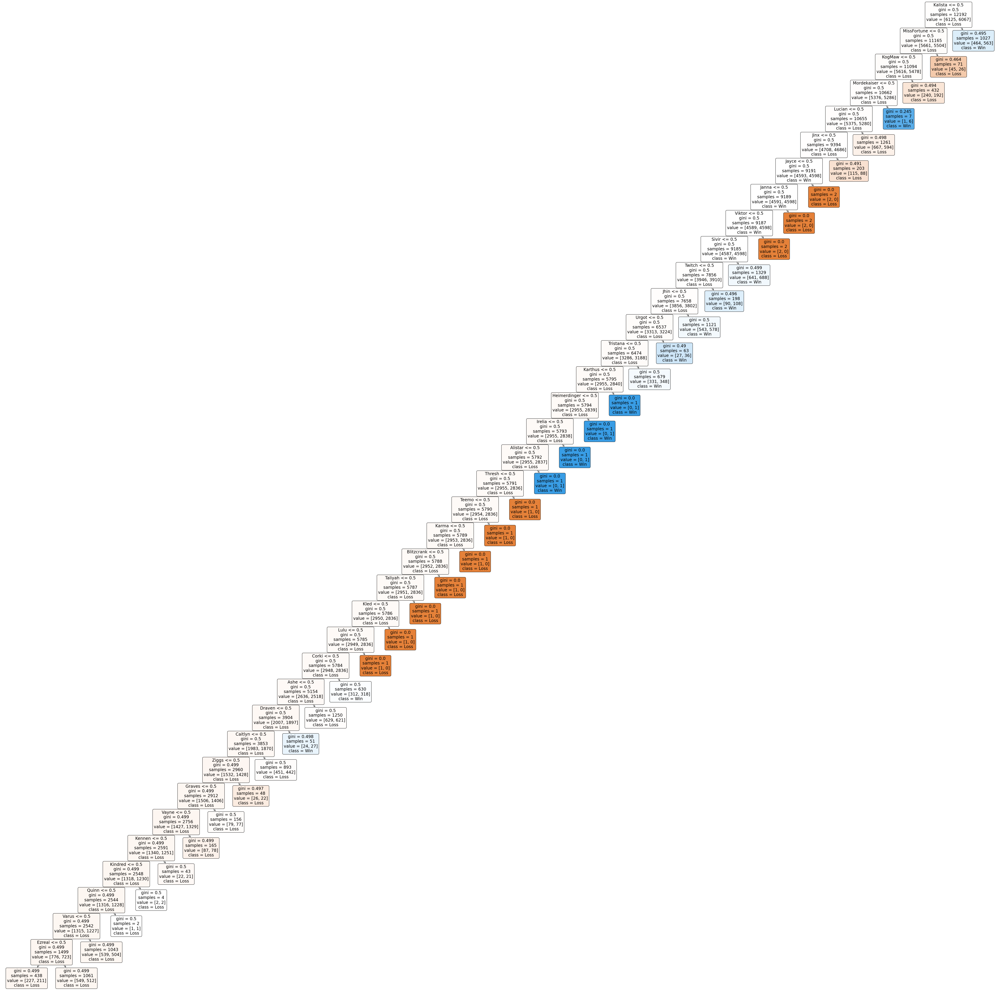

In [47]:
ADCTree, ADCData = getTree(ADCDummies, 40)
printTree(ADCTree, ADCData)

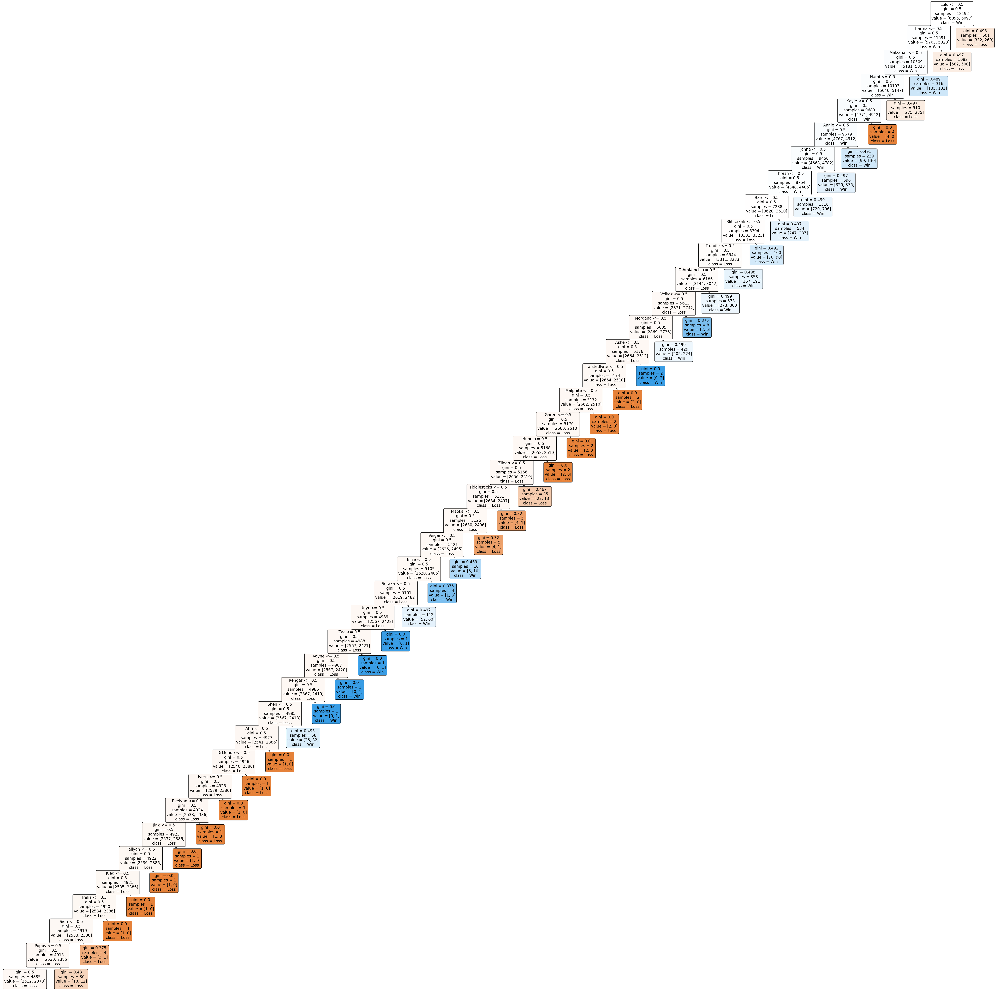

In [48]:
supportTree, supportData = getTree(supportDummies, 40)
printTree(supportTree, supportData)

## Let's find out the calssification accuracy of the trees.

In [53]:
#function that presents the accuracy of a tree
def showTreeAccuracy(tree, tree_data):
    #get train/test data
    X_train, X_test, y_train, y_test = tree_data
    #make predictions from train and test data
    y_train_pred = tree.predict(X_train)
    y_test_pred = tree.predict(X_test)
    # Check the Goodness of Fit (on Train Data)
    print("Goodness of Fit of Model \tTrain Dataset")
    print("Classification Accuracy \t:", tree.score(X_train, y_train))
    print()
    # Check the Goodness of Fit (on Test Data)
    print("Goodness of Fit of Model \tTest Dataset")
    print("Classification Accuracy \t:", tree.score(X_test, y_test))
    print()
    # Plot the Confusion Matrix for Train and Test
    f, axes = plt.subplots(1, 2, figsize=(12, 4))
    f.suptitle("TRAIN / TEST", fontsize=16)
    sb.heatmap(confusion_matrix(y_train, y_train_pred),
            annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
    sb.heatmap(confusion_matrix(y_test, y_test_pred), 
            annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.5234580052493438

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5026246719160105



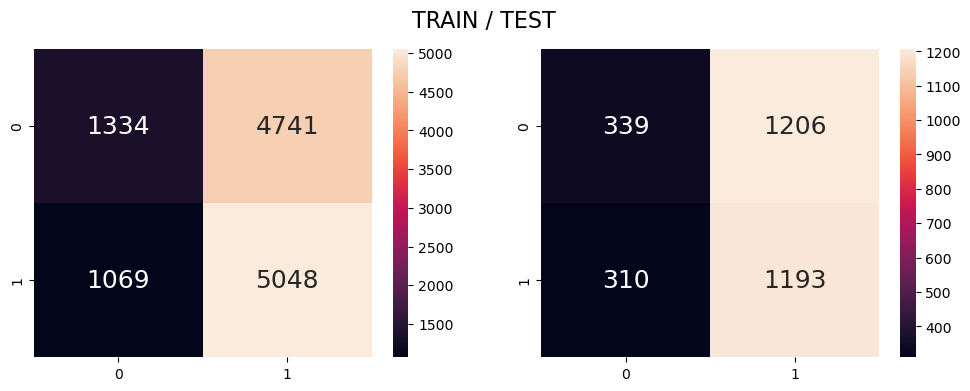

In [54]:
showTreeAccuracy(topTree, topData)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.5249343832020997

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5298556430446194



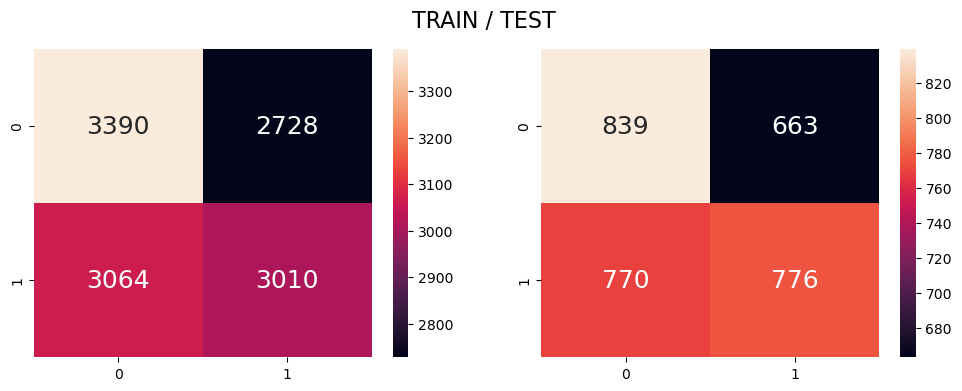

In [26]:
showTreeAccuracy(jungleTree, jungleData)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.53001968503937

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5141076115485564



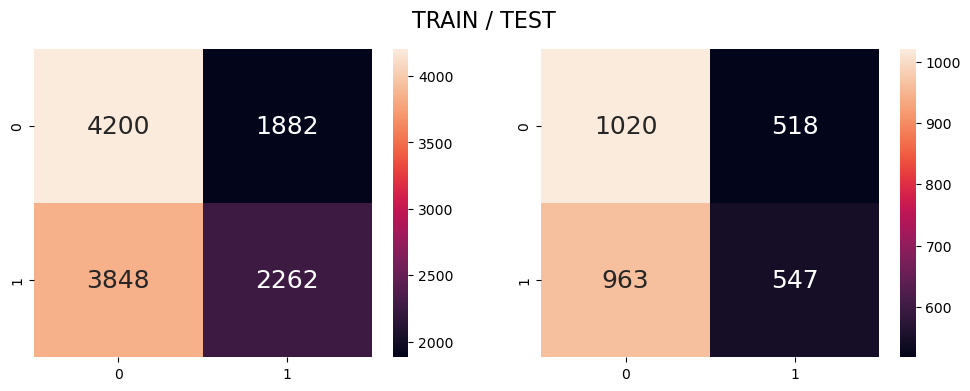

In [27]:
showTreeAccuracy(middleTree, middleData)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.5193569553805775

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.515748031496063



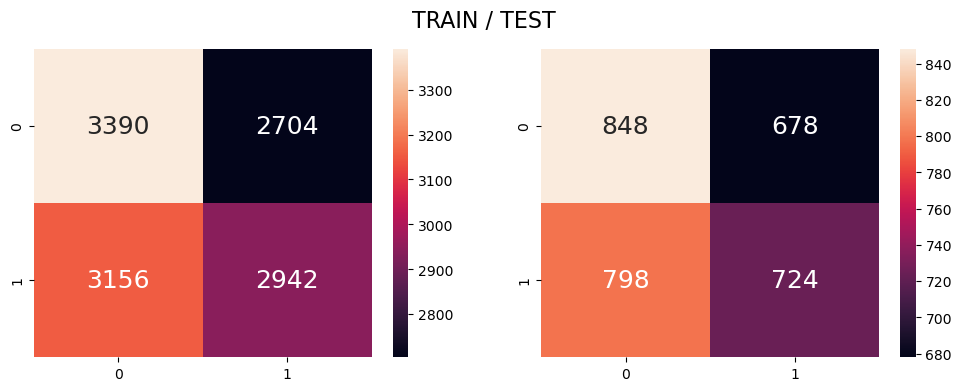

In [28]:
showTreeAccuracy(ADCTree, ADCData)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.5274770341207349

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5085301837270341



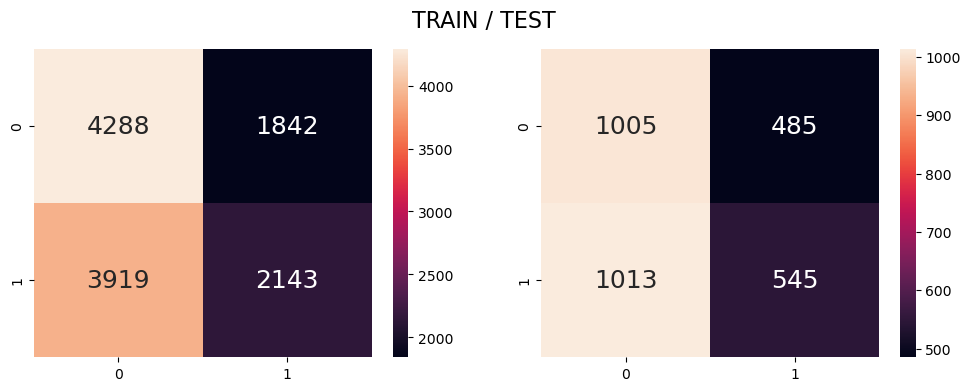

In [29]:
showTreeAccuracy(supportTree, supportData)

#### As expected, the classification accuracies don't seem so pleasing :(

# Conclusion

#### It seems that there are 2 main flaws in using this categorical dataset in predicting a value. The first would be the usage of categorical values. Even with one-hot encoding, categorical values are naturally discrete rather than continuous, which makes observing patterns harder, and hence, predicting methods don't usually rely on categorical data.

---

Continue in `Gold_Analysis.ipynb`